In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
 
path = "../MigrantesChile (2005-2016).xlsx"
dataset = pd.read_excel(path)
dataset.head()

,ID Continent,Continent,ID Country,Country,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016
0,142,Asia,308,Afghanistán,8,4,5,1,2,1,3,6,15,4,12,15
1,150,Europa,518,Albania,2,1,1,2,2,5,3,2,1,2,7,11
2,150,Europa,563,Alemania,495,481,562,614,587,644,685,747,687,845,778,582
3,150,Europa,525,Andorra,2,1,1,1,0,0,2,0,1,2,2,1
4,2,África,140,Angola,1,2,4,3,2,4,6,8,1,1,13,19


# Homework Exercise 1 Review

Lineplot de los países de cada continente que aporten más inmigrantes en total o en un año determinado

In [2]:
def top_by_continent(df, years):
    df["total"] = dataset[years].sum(axis=1)
    top = df.loc[df.groupby(["Continent"])["total"].idxmax()]
    plt.figure(figsize=(10,5))
    for i in range(len(top)):
        plt.plot(years, top[years].iloc[i])
    plt.xlabel("years")
    plt.ylabel("inmigrants")
    plt.legend(top.Country)

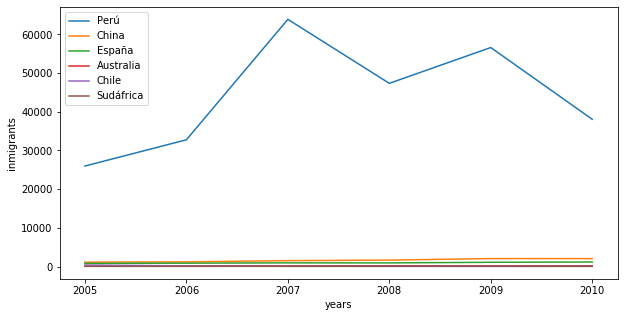

In [3]:
years = np.arange(2005,2011)
top_by_continent(dataset,years)

# Scatter plot

In [4]:
totals_by_year = pd.DataFrame(dataset[np.arange(2005,2017)].sum(axis=0))
totals_by_year.reset_index(inplace=True)
totals_by_year.columns = ["Year", "Total"]

In [5]:
totals_by_year

,Year,Total
0,2005,53187
1,2006,61884
2,2007,102471
3,2008,85132
4,2009,101559
5,2010,85339
6,2011,98506
7,2012,132218
8,2013,157999
9,2014,173216


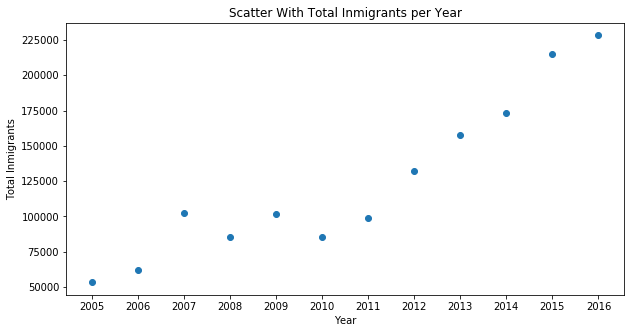

In [6]:
pd.to_numeric(totals_by_year.Year)
fig = plt.figure(figsize=(10,5))
plt.scatter(totals_by_year["Year"], totals_by_year["Total"])
plt.xticks(np.arange(2005,2017))
plt.xlabel("Year")
plt.ylabel("Total Inmigrants")
plt.title("Scatter With Total Inmigrants per Year")
plt.show()

# Exercise 1

Create a scatterplot that shows the total per year for each continent.

In [7]:
def plot_by_continent(df,years):
    total = pd.DataFrame(df.groupby("Continent")[years].sum(axis=0))
    total = total.reset_index()
    plt.figure(figsize=(10,5))
    for i in range(len(total)):
        plt.scatter(years, total[years].loc[i])
        plt.legend(total["Continent"])

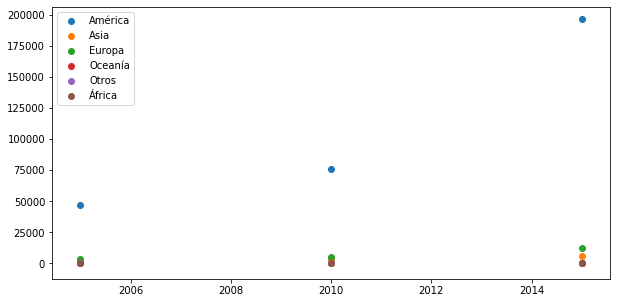

In [8]:
years = [2005,2010,2015]
plot_by_continent(dataset, years)

# Bubble Plot (scatter with sizes)

In [9]:
data_url = 'https://python-graph-gallery.com/wp-content/uploads/gapminderData.csv'
dataset = pd.read_csv(data_url)
dataset.head()

,country,year,pop,continent,lifeExp,gdpPercap
0,Afghanistan,1952,8425333.0,Asia,28.801,779.445314
1,Afghanistan,1957,9240934.0,Asia,30.332,820.853030
2,Afghanistan,1962,10267083.0,Asia,31.997,853.100710
3,Afghanistan,1967,11537966.0,Asia,34.020,836.197138
4,Afghanistan,1972,13079460.0,Asia,36.088,739.981106


In [10]:
chile = dataset[dataset.country == "Chile"]

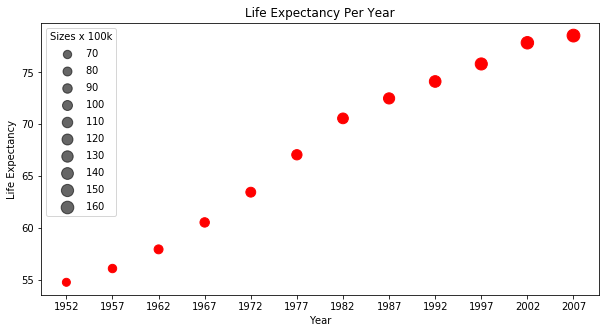

In [17]:
plt.figure(figsize=(10,5))
scatter = plt.scatter(chile["year"], chile["lifeExp"], s=chile["pop"]/1e5, c="red")
plt.xticks(chile["year"])
plt.xlabel("Year")
plt.ylabel("Life Expectancy")
plt.title("Life Expectancy Per Year")
handles, labels = scatter.legend_elements(prop="sizes", alpha=0.6)
plt.legend(handles,labels,title="Sizes x 100k")
plt.show()

# Exercise 2

Create a scatter plot that shows the life expectancy by gpd per capita, but uses colors to display population

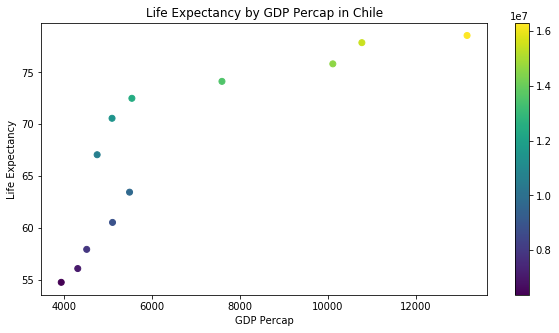

In [16]:
plt.figure(figsize=(10,5))
scatter = plt.scatter(chile["gdpPercap"], chile["lifeExp"], c=chile["pop"])
plt.xlabel("GDP Percap")
plt.ylabel("Life Expectancy")
plt.title("Life Expectancy by GDP Percap in Chile")
handles, labels = scatter.legend_elements(prop="sizes", alpha=0.6)
plt.colorbar()
plt.show()

# Colormaps

- Sequential: change in lightness and often saturation of color incrementally, often using a single hue; should be used for representing information that has ordering.
- Diverging: change in lightness and possibly saturation of two different colors that meet in the middle at an unsaturated color; should be used when the information being plotted has a critical middle value, such as topography or when the data deviates around zero.
- Cyclic: change in lightness of two different colors that meet in the middle and beginning/end at an unsaturated color; should be used for values that wrap around at the endpoints, such as phase angle, wind direction, or time of day.
- Qualitative: often are miscellaneous colors; should be used to represent information which does not have ordering or relationships.

<img src="perceptually_uniform.webp"/>
<img src="sequential.webp"/>
<img src="diverging.webp"/>
<img src="cyclic.webp"/>


In [88]:
from matplotlib import cm
colormap = cm.get_cmap('plasma', 12)

In [89]:
colormap.colors

array([[0.050383, 0.029803, 0.527975, 1.      ],
       [0.241396, 0.014979, 0.610259, 1.      ],
       [0.387183, 0.001434, 0.654177, 1.      ],
       [0.523633, 0.024532, 0.652901, 1.      ],
       [0.650746, 0.125309, 0.595617, 1.      ],
       [0.752312, 0.227133, 0.513149, 1.      ],
       [0.836801, 0.329105, 0.430905, 1.      ],
       [0.907365, 0.434524, 0.35297 , 1.      ],
       [0.963203, 0.553865, 0.271909, 1.      ],
       [0.991985, 0.681179, 0.195295, 1.      ],
       [0.986509, 0.822401, 0.143557, 1.      ],
       [0.940015, 0.975158, 0.131326, 1.      ]])

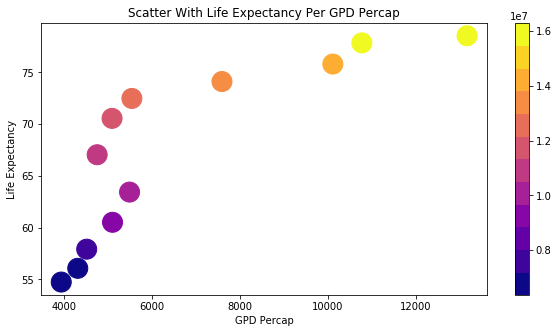

In [90]:
plt.figure(figsize=(10,5))
scatter = plt.scatter(chile["gdpPercap"], chile["lifeExp"], c=chile['pop'], s=400, cmap=colormap)
plt.xlabel("GPD Percap")
plt.ylabel("Life Expectancy")
plt.title("Scatter With Life Expectancy Per GPD Percap")
plt.colorbar()
plt.show()

# Matplotlib is cool, but is there more ?

So far we have learned to create some basic plots on matplotlib. **But we have only scratched the surface** There are much more stuff we can do using just matplotlib.

<img src="pong.png"/>

Wanna create something like that or just add more intresting features to your plots ? 

Take a look at this for event handling in general: https://matplotlib.org/3.1.1/users/event_handling.html

Also check this example to create an interactive plot: https://matplotlib.org/3.1.1/users/event_handling.html

<br/>

# What about other libraries ?

<img src="PythonVisLandscape.jpg" />

In [18]:
import plotly.express as px

In [19]:
px.scatter(chile, x="year", y="lifeExp",size='pop' )

In [20]:
dataset

,country,year,pop,continent,lifeExp,gdpPercap
0,Afghanistan,1952,8425333.0,Asia,28.801,779.445314
1,Afghanistan,1957,9240934.0,Asia,30.332,820.853030
2,Afghanistan,1962,10267083.0,Asia,31.997,853.100710
3,Afghanistan,1967,11537966.0,Asia,34.020,836.197138
4,Afghanistan,1972,13079460.0,Asia,36.088,739.981106
...,...,...,...,...,...,...
1699,Zimbabwe,1987,9216418.0,Africa,62.351,706.157306
1700,Zimbabwe,1992,10704340.0,Africa,60.377,693.420786
1701,Zimbabwe,1997,11404948.0,Africa,46.809,792.449960
1702,Zimbabwe,2002,11926563.0,Africa,39.989,672.038623


In [21]:
px.scatter(dataset[dataset.year==2007], x="gdpPercap", y="lifeExp", size="pop", color="continent",
           hover_name="country", size_max=60)

# Exercise 3

Animate the above plot for each year.

Tips: use *animation_frame* and *animation_group* to animate.

If the bubbles look too big or get out of the plot borders try changing the *size* argument or add *range_x* or *range_y* to change the axes ranges. (range_x and range_y are arrays of min and max values: [min,max])

In [22]:
px.scatter(dataset, x="gdpPercap", y="lifeExp", size="pop", color="continent",
           hover_name="country", size_max=60, animation_frame="year", animation_group="country")

In [23]:
dataset = px.data.gapminder()
dataset

,country,continent,year,lifeExp,pop,gdpPercap,iso_alpha,iso_num
0,Afghanistan,Asia,1952,28.801,8425333,779.445314,AFG,4
1,Afghanistan,Asia,1957,30.332,9240934,820.853030,AFG,4
2,Afghanistan,Asia,1962,31.997,10267083,853.100710,AFG,4
3,Afghanistan,Asia,1967,34.020,11537966,836.197138,AFG,4
4,Afghanistan,Asia,1972,36.088,13079460,739.981106,AFG,4
...,...,...,...,...,...,...,...,...
1699,Zimbabwe,Africa,1987,62.351,9216418,706.157306,ZWE,716
1700,Zimbabwe,Africa,1992,60.377,10704340,693.420786,ZWE,716
1701,Zimbabwe,Africa,1997,46.809,11404948,792.449960,ZWE,716
1702,Zimbabwe,Africa,2002,39.989,11926563,672.038623,ZWE,716


In [24]:
px.scatter_geo(dataset, locations="iso_alpha", color="continent", hover_name="country", size="pop",
               animation_frame="year", projection="natural earth", size_max=30)

# Exercise 4

Use Plotly and the Tips dataset to create an animation showing the tip by total bill for each day. Group by male and female.

In [25]:
tips = px.data.tips()
tips

,total_bill,tip,sex,smoker,day,time,size
0,16.99,1.01,Female,No,Sun,Dinner,2
1,10.34,1.66,Male,No,Sun,Dinner,3
2,21.01,3.50,Male,No,Sun,Dinner,3
3,23.68,3.31,Male,No,Sun,Dinner,2
4,24.59,3.61,Female,No,Sun,Dinner,4
...,...,...,...,...,...,...,...
239,29.03,5.92,Male,No,Sat,Dinner,3
240,27.18,2.00,Female,Yes,Sat,Dinner,2
241,22.67,2.00,Male,Yes,Sat,Dinner,2
242,17.82,1.75,Male,No,Sat,Dinner,2


In [26]:
px.scatter(tips, x="total_bill", y="tip", color="sex",hover_name="sex", animation_frame="day", size='size')

# Exercise 5

Use the *marginal_x* or *marginal_y* argument of px.scatter() to add boxplots and histograms to the side of your scatterplot and visualize distribution in a single figure. 

Choose either "boxplot" or "histogram" and create a plot for each

In [27]:
iris = px.data.iris()
iris

,sepal_length,sepal_width,petal_length,petal_width,species,species_id
0,5.1,3.5,1.4,0.2,setosa,1
1,4.9,3.0,1.4,0.2,setosa,1
2,4.7,3.2,1.3,0.2,setosa,1
3,4.6,3.1,1.5,0.2,setosa,1
4,5.0,3.6,1.4,0.2,setosa,1
...,...,...,...,...,...,...
145,6.7,3.0,5.2,2.3,virginica,3
146,6.3,2.5,5.0,1.9,virginica,3
147,6.5,3.0,5.2,2.0,virginica,3
148,6.2,3.4,5.4,2.3,virginica,3


In [28]:
px.scatter(iris, x="sepal_width", y="sepal_length", color="species", marginal_y="histogram", marginal_x="histogram")

# Holoviews + Datashader

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
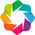

In [20]:
import datashader as ds
import numpy as np
import holoviews as hv

from holoviews import opts

from holoviews.operation.datashader import datashade, shade, dynspread, rasterize
from holoviews.operation import decimate
hv.extension('bokeh')

In [21]:
decimate.max_samples=1000
dynspread.max_px=20
dynspread.threshold=0.5

In [27]:
points = hv.Points(np.random.multivariate_normal((0,0), [[0.1, 0.1], [0.1, 1.0]], (100000,)),label="Points")

In [28]:
points

:Points   [x,y]

In [29]:
datashade(points)

:DynamicMap   []
   :RGB   [x,y]   (R,G,B,A)

In [40]:
fixed_hover = (datashade(points) * hv.QuadMesh(rasterize(points, width=10, height=10, dynamic=False)))
fixed_hover.opts(opts.QuadMesh(tools=['hover'], alpha=0, hover_alpha=0.2))

:DynamicMap   []
   :Overlay
      .RGB.Points      :RGB   [x,y]   (R,G,B,A)
      .QuadMesh.Points :QuadMesh   [x,y]   (Count)